<a href="https://colab.research.google.com/github/Blacklotus89898/ComputerVisionMiscellaneous/blob/main/esce_415_a2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introduction to Computer Vision (ECSE 415)
## Assignment 2: Feature Matching, Image Alignment

DEADLINE: October 10, 11:59 PM

Name: Steve Chen

ID: 261106847

0. Setup and Environment

In [2]:
# Imports
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
import os

Mounted at /content/drive


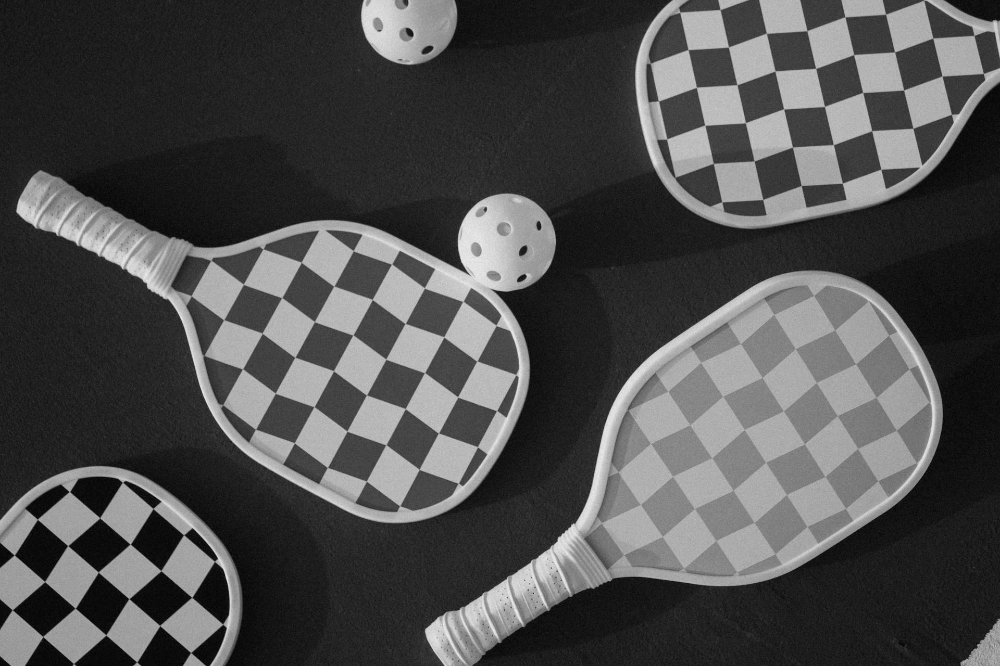

Height: 1280
Width: 1920
Channels: 3


In [3]:
# Loading from the drive
from google.colab import drive
drive.mount('/content/drive')

base_path = "/content/drive/MyDrive/ECSE415/images"
img_path = os.path.join(base_path, "checkered_pickleball_paddles.png")
img = cv2.imread(img_path)
cv2_imshow(img)

height, width, channels = img.shape
print("Height:", height)
print("Width:", width)
print("Channels:", channels)

## 1 Harris Corner Detection [40 points]


### 1.1. Implement Harris Corner Detection. [20 points]

In [4]:
import cv2
import numpy as np

def harris_corner_detection(image, alpha=0.05, threshold=1e6):
    """
    Harris corner detector (manual implementation).
    image: grayscale input (uint8)
    alpha: Harris detector free parameter (0.04 - 0.06 typical)
    threshold: minimum R response to keep a corner
    returns: list of (x, y) corner coordinates
    """
    # Ensure float for calculations
    image = np.float32(image)

    # Prewitt filters
    Dx = np.array([[-1,0,1],[-1,0,1],[-1,0,1]], dtype=np.float32)  # along x
    Dy = np.array([[-1,-1,-1],[0,0,0],[1,1,1]], dtype=np.float32)  # along y

    # Sobel filters
    Dx = np.array([[-1,0,1],[-2,0,2],[-1,0,1]], dtype=np.float32)  # along x
    Dy = np.array([[-1,-2,-1],[0,0,0],[1,2,1]], dtype=np.float32)  # along y

    # Derivatives
    Ix = cv2.filter2D(image, -1, Dx)
    Iy = cv2.filter2D(image, -1, Dy)

    # Products of derivatives
    Ixx = Ix * Ix
    Iyy = Iy * Iy
    Ixy = Ix * Iy

    # Gaussian smoothing
    Gxx = cv2.GaussianBlur(Ixx, (3, 3), 1.5)
    Gyy = cv2.GaussianBlur(Iyy, (3, 3), 1.5)
    Gxy = cv2.GaussianBlur(Ixy, (3, 3), 1.5)

    # Harris response
    R = Gxx * Gyy - Gxy**2 - alpha * (Gxx + Gyy)**2

    # Non-maximum suppression
    candidates = []
    for y in range(1, R.shape[0]-1):
        for x in range(1, R.shape[1]-1):
            val = R[y, x]
            if val > threshold and val == np.max(R[y-1:y+2, x-1:x+2]):
                candidates.append((x, y))

    return candidates

### 1.2. Visualize Harris Corners. [5 points]

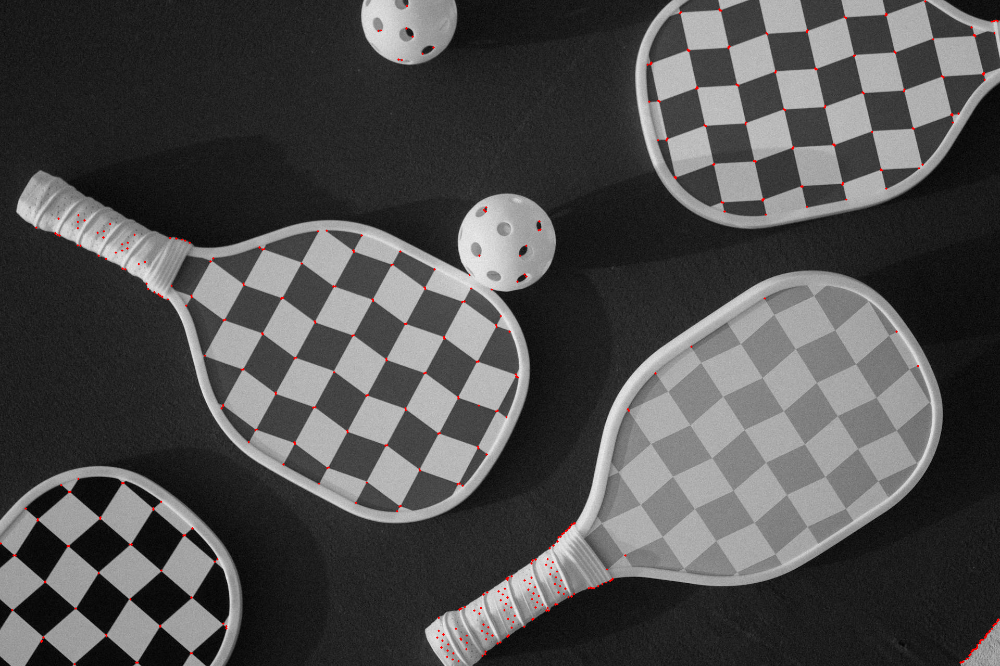

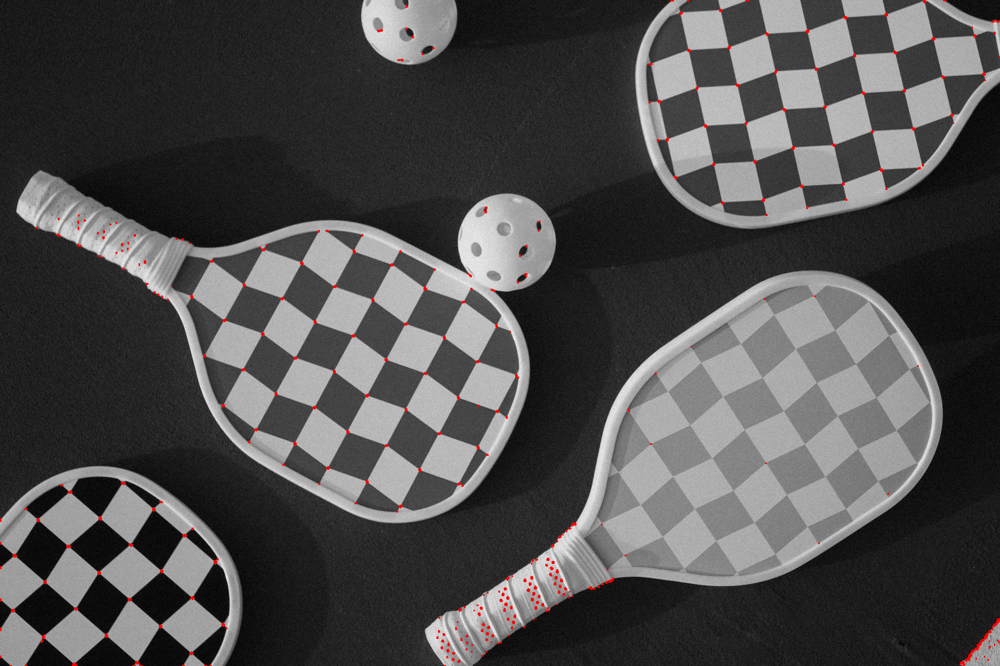

In [5]:
# Visualizing
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

corners = harris_corner_detection(gray, alpha=0.05, threshold=1e7)

img_color = img.copy()
for (x,y) in corners:
    cv2.circle(img_color, (x,y), 2, (0,0,255), -1)

cv2_imshow(img_color)

# Comparing with CV2
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
gray = np.float32(gray)
dst = cv2.cornerHarris(gray, 2, 3, 0.04)
dst = cv2.dilate(dst, None)
img_color = img.copy()
img_color[dst > 0.01 * dst.max()] = [0, 0, 255]
cv2_imshow(img_color)

### 1.3. Threshold Exploration [5 points]

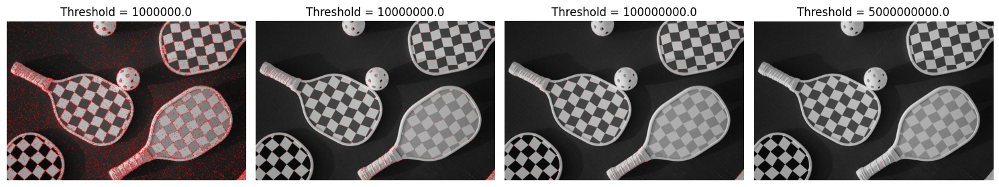

In [8]:
# Thresholds
thresholds = [1e6, 1e7, 1e8, 5e9]

# Create a figure
fig, axes = plt.subplots(1, len(thresholds), figsize=(15, 5))

for i, th in enumerate(thresholds):
    # Detect corners using your custom function
    corners = harris_corner_detection(gray, alpha=0.05, threshold=th)

    # Copy original image
    img_color = img.copy()

    # Draw corners
    for (x, y) in corners:
        cv2.circle(img_color, (x, y), 2, (0, 0, 255), -1)

    # Display image in matplotlib
    axes[i].imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f"Threshold = {th}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()


| Threshold Value | Observed Effect | Notes / Implications |
|-----------------|----------------|-------------------|
| Low (1e6)  | Many points detected, including noise | High sensitivity; may include false positives |
| Medium (1e7) | Balanced detection; most relevant points captured | Good trade-off between sensitivity and precision |
| High (1e8) | Few points detected, only strongest features | Low sensitivity; may miss weaker but valid features |
| Very High (5e9) | Very few or no points detected | Risk of missing critical features; too strict |


### 1.4. Harris Corners in Transformed Images (Rotation and Scaling). [10 points]

Corners dectected for 0.5 scaling factor: 925
Corners dectected for 1.0 scaling factor: 15825
Corners dectected for 1.5 scaling factor: 6282
Corners dectected for 2.0 scaling factor: 3732


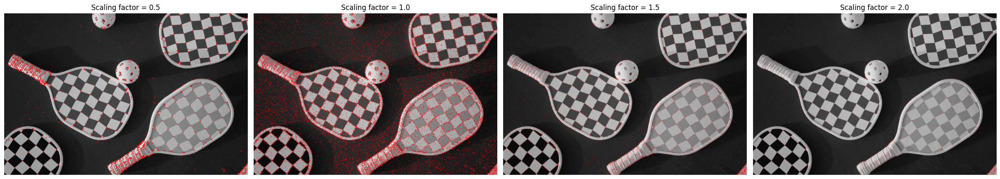

Corners dectected for 30 degrees: 6192
Corners dectected for 45 degrees: 6300
Corners dectected for 90 degrees: 15881
Corners dectected for 135 degrees: 6298


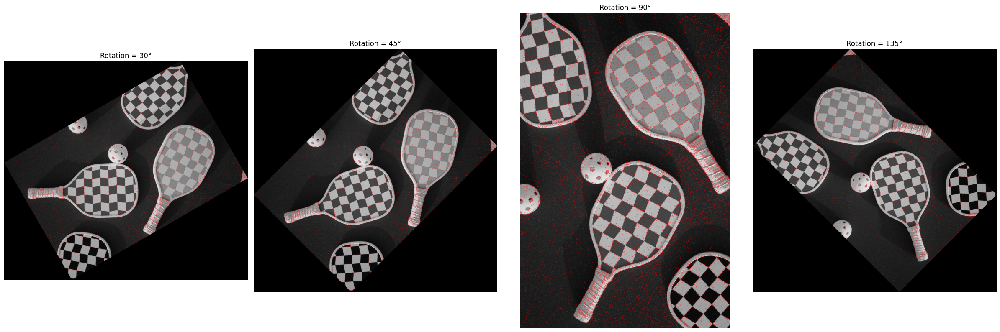

In [28]:
# a) Scaled image
scaling_factors = [0.5, 1.0, 1.5, 2.0]

new_dimensions = []
for factor in scaling_factors:
    new_height = int(height * factor)
    new_width = int(width * factor)
    new_dimensions.append((new_width, new_height))

# Create a figure
fig, axes = plt.subplots(1, len(new_dimensions), figsize=(24, 8))

for i, (new_width, new_height) in enumerate(new_dimensions):
    # Resize
    resized_img = cv2.resize(gray, (new_width, new_height))
    # Detect corners
    corners = harris_corner_detection(resized_img, alpha=0.05, threshold=1e6)
    print("Corners dectected for " + str(scaling_factors[i]) + " scaling factor: " + str(len(corners)))

    # Copy original image
    scaled_img =  cv2.resize(img.copy(), (new_width, new_height))

    # Draw corners
    for (x, y) in corners:
        cv2.circle(scaled_img, (x, y), 2, (0, 0, 255), -1)

    # cv2_imshow(scaled_img)
    # Display image in matplotlib
    axes[i].imshow(cv2.cvtColor(scaled_img, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f"Scaling factor = {scaling_factors[i]}")
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# b) rotation
height, width = gray.shape[:2]

rotation_factors = [30, 45, 90, 135] # added 45

fig, axes = plt.subplots(1, len(rotation_factors), figsize=(24, 8))

for i, angle in enumerate(rotation_factors):
    # Compute new dimensions
    rad = np.deg2rad(angle)
    new_height = int(height * np.abs(np.cos(rad)) + width * np.abs(np.sin(rad)))
    new_width = int(height * np.abs(np.sin(rad)) + width * np.abs(np.cos(rad)))

    # Rotation matrix with translation
    M = cv2.getRotationMatrix2D((width/2, height/2), angle, 1)
    M[0, 2] += (new_width - width) / 2
    M[1, 2] += (new_height - height) / 2

    # Rotate grayscale for corner detection
    rotated_gray = cv2.warpAffine(gray, M, (new_width, new_height))
    corners = harris_corner_detection(rotated_gray, alpha=0.05, threshold=1e6)
    print("Corners dectected for " + str(angle) + " degrees: " + str(len(corners)))

    # Rotate original color image
    rotated_color = cv2.warpAffine(img, M, (new_width, new_height))

    # Overlay corners on the rotated image
    overlay = rotated_color.copy()
    for (x, y) in corners:
        cv2.circle(overlay, (x, y), 2, (0, 0, 255), -1)

    # Blend rotated original and overlay (fade original underneath)
    blended = cv2.addWeighted(rotated_color, 0.5, overlay, 0.5, 0)

    # Display
    axes[i].imshow(cv2.cvtColor(blended, cv2.COLOR_BGR2RGB))
    axes[i].set_title(f"Rotation = {angle}°")
    axes[i].axis('off')


plt.tight_layout()
plt.show()

| **Scaling Factor** | **Corners Detected** |
| ------------------ | -------------------- |
| 0.5                | 925                  |
| 1.0                | 15,825               |
| 1.5                | 6,282                |
| 2.0                | 3,732                |

At the original size (1.0), the detector finds the largest number of corners (15,825).

When the image is downscaled (0.5), most small corner details are lost, resulting in a much smaller count.

Interestingly, upsampling (1.5, 2.0) does not preserve or increase corner counts; instead, fewer corners are detected. This happens because interpolation during resizing smooths out pixel intensity changes, weakening corner responses.

Overall, Harris corner detection is scale-variant — it performs best at the resolution close to the original but fails to maintain consistent detection across scales.

| **Rotation Angle (°)** | **Corners Detected** |
| ---------------------- | -------------------- |
| 30°                    | 6,192                |
| 45°                    | 6,300                |
| 90°                    | 15,881               |
| 135°                   | 6,298                |

Corner detection remains relatively stable under moderate rotations (30°, 45°, 135°), with counts around ~6,200–6,300.

At 90°, the number of detected corners jumps to 15,881, which is almost the same as the unrotated original (15,825).

This suggests that Harris corner detection is rotation-invariant in theory, but in practice the implementation shows variations depending on how edges align with the image grid. Specifically, rotations like 90° that align with pixel axes preserve corners better, while arbitrary rotations (e.g., 30°, 45°) introduce interpolation and blur, reducing corner responses.

## 2 SIFT Feature Detection [30 points]

### 2.1. Implement SIFT Keypoint Detection and Matching. [20 points]

### 2.2. SIFT Keypoints on Transformed Images (Rotation and Scaling). [10 points]

## 3 Image Alignment [30 points]

### 3.1. Keypoint Detection and Matching. [5 points]

### 3.2. Homography Estimation and Verification. [10 points]

### 3.3. Image Stitching and Blending. [10 points]

### 3.4. Evaluation and Reflection. [5 point]